# Load data from Kaggle

In [1]:
# https://stackoverflow.com/questions/49310470/using-kaggle-datasets-in-google-colab
# Run this cell and select the kaggle.json file downloaded
# from the Kaggle account settings page.
from google.colab import files
files.upload()

{}

In [2]:
# Let's make sure the kaggle.json file is present.
!ls -lha kaggle.json

ls: cannot access 'kaggle.json': No such file or directory


In [3]:
# Next, install the Kaggle API client.
!pip install -q kaggle

In [4]:
# The Kaggle API client expects this file to be in ~/.kaggle,
# so move it there.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [5]:
# Download data from Kaggle using its API
!kaggle competitions download -c vsb-power-line-fault-detection

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python2.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python2.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 146, in authenticate
    self.config_file, self.config_dir))
IOError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [6]:
# https://stackoverflow.com/questions/49685924/extract-google-drive-zip-from-google-colab-notebook
!unzip /content/train.parquet.zip
# !unzip /content/test.parquet.zip

unzip:  cannot find or open /content/train.parquet.zip, /content/train.parquet.zip.zip or /content/train.parquet.zip.ZIP.


# Load Libraries

In [7]:
!sudo apt-get install libsnappy-dev
!pip install python-snappy
!pip install fastparquet
!pip install kneed

# https://github.com/raphaelvallat/entropy/issues/4#issue-533857629
!pip install git+https://github.com/raphaelvallat/entropy.git

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  libsnappy-dev
0 upgraded, 1 newly installed, 0 to remove and 16 not upgraded.
Need to get 27.2 kB of archives.
After this operation, 108 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libsnappy-dev amd64 1.1.7-1 [27.2 kB]
Fetched 27.2 kB in 0s (97.6 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package libsnappy-dev:amd64.
(Reading database ... 145483 files and

In [4]:
import numpy as np
import pandas as pd
import os
%matplotlib inline
import matplotlib 
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from scipy.stats import norm, skew

import gc
import pywt
from statsmodels.robust import mad
import scipy
from scipy import signal
from scipy.signal import butter
from scipy.signal import find_peaks, peak_widths, peak_prominences

from datetime import datetime

from scipy.signal import periodogram
from sklearn.neighbors import KDTree

from keras.layers import *
from keras.models import *
from keras import backend as K # The backend gives us access to tensorflow operations and allow us to create attention class
from keras import optimizers # Allows to access Adam class and modify some parameters
from keras.callbacks import * # This object helps the model to train in a smarter way, avoid overfitting
from keras import activations
from keras import regularizers
from keras import initializers
from keras import constraints
from keras.utils.vis_utils import plot_model
import tensorboard
%load_ext tensorboard
import tensorflow.compat.v1 as tf

# https://stackoverflow.com/a/56569206/4699076
tf.disable_eager_execution()

from sklearn.model_selection import GridSearchCV, StratifiedKFold

import concurrent.futures
import multiprocessing
from kneed import KneeLocator
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import matthews_corrcoef
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import SGDRegressor
from IPython.display import Image
from sklearn.metrics import matthews_corrcoef
import numba
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import make_scorer
from sklearn.metrics import confusion_matrix

import scipy.stats as stats
import pylab
from sklearn.ensemble import RandomForestClassifier
import random
import pickle
from sklearn.metrics import log_loss
from entropy import *
from prettytable import PrettyTable
import lightgbm as lgb

from sklearn.preprocessing import OneHotEncoder
from itertools import combinations

import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'kneed'

In [9]:
from google.colab import drive
from google.colab import output
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
path = '/content/drive/My Drive/Colab Notebooks/Assignment_29-VSB_Power_Line/'
test_path = '/content/drive/My Drive/Colab Notebooks/Assignment_29-VSB_Power_Line/test_path'

# Read Data

In [ ]:
metadata_train = pd.read_csv("/content/metadata_train.csv")
metadata_test = pd.read_csv("/content/metadata_test.csv")

# train = pd.read_parquet('/content/train.parquet', engine='fastparquet')
# test = pd.read_parquet('/content/test.parquet', engine='fastparquet')

# Featurization

## Utility Functions

**General**

In [11]:
def parallel_proc_func(func, cols, no_signals, init_offset, 
                       save_file_path='None', *args):
  """
  Perform parallel processing of the given function. 
  If a function has to be parallelized over several items (signal_ids), then they
  can be parallelized based on the number of cores present in the CPU.
  The results are stored in a csv file.

  Parameters
  ----------
  func : function object
    The function which is to be run parallely.
  cols : numpy.ndarray
    Names of the result columns that is to be stored in the csv file
  no_signals : int
    Total number of signals to be processed
  init_offset : int
    Initial offset of the item (signal_id) from where the iterations are to begin
  save_file_path : string (Default - 'None')
    Path of the csv file where the results are to be stored.
    If None, resulting dataframe is returned.
  *args : Tuple
    Additional parameters (along with signal id) that are needed for the func 
    object.  

  Returns
  -------
  None (Default)
    If the file has to be saved, then the resultant data frame is stored in the
    respective save_file_path. Hence, nothing is returned.
  df : pandas.DataFrame
    If the file is not to be saved, then the resultant data frame is returned.
  """
  # Get number of cores in cpu: https://stackoverflow.com/a/1006337/4699076
  batch_size = multiprocessing.cpu_count() # no. of cores in the cpu, needed for parallel processing  
  end_val = no_signals//batch_size
  # Save the file after processing (save_pt*batch_size) number of signals
  save_pt = end_val//10
  if save_pt == 0:
    save_pt = 1

  # Check if file is already processed
  if os.path.isfile(save_file_path):
    df = pd.read_csv(save_file_path)
    df.drop(['Unnamed: 0'], axis=1, inplace=True)
    start_val = df.shape[0]//batch_size
    print(f"{df.shape[0]} signal ids already processed.")
    print("Processing the remaining signal ids...")    
  else:
    # If specific columns are given, then create a dataframe with the given columns
    if cols != 'None':
      df = pd.DataFrame(columns=cols)
    # Create an empty dataframe if no columns given
    else:
      df = pd.DataFrame()
    if save_file_path != 'None':
      df.to_csv(save_file_path)
    
    start_val = 0
  
  start_batch = datetime.now()
  # Begin iteration
  for i in range(start_val, end_val):
    sig_id = np.arange(init_offset+(i*batch_size),
                        init_offset+(i*batch_size)+batch_size)
    # If additional arguments are provided for 'func' object, 
    # then create a list containing signal ids and new argument
    if len(args) != 0:
      func_args = [(x, args[0]) for x in sig_id]
    # If new arguments are not provided, then create a list of signal ids
    else:
      func_args = sig_id
    
    # Begin parallel processing
    with concurrent.futures.ProcessPoolExecutor() as executor:
      results = executor.map(func, func_args)
      for result in results:
        # For dataframe with pre-defined columns
        if cols != 'None':
          temp_df = pd.DataFrame(data=[result], columns=cols)
        # For dataframes with no pre-defined columns
        else:
          temp_df = pd.DataFrame(data=[result])
        df = df.append(temp_df, ignore_index=True)

    # Save file at the checkpoint
    if ((i+1)%save_pt==0):
      # Calculate and print the number of signals processed
      no_sigs_processed = (i+1)*batch_size
      print(f"{no_sigs_processed} ({np.round(((no_sigs_processed)/no_signals)*100, 2)}%) signals completed. Time taken: {datetime.now() - start_batch}")
      if save_file_path != 'None':
        df.to_csv(save_file_path)
      start_batch = datetime.now()

  # If all the signals are already processed, then start_val will be equal to end_val. 
  if start_val != end_val:
    no_signals_remaining = no_signals%batch_size
    if no_signals_remaining!=0:
      sig_id = np.arange(init_offset+(end_val*batch_size),
                        init_offset+(end_val*batch_size)+no_signals_remaining)
      if len(args) != 0:
        func_args = [(x, args[0]) for x in sig_id]
      else:
        func_args = sig_id

      # Parallel processing
      with concurrent.futures.ProcessPoolExecutor() as executor:
        results = executor.map(func, func_args)
        for result in results:
          if cols != 'None':
            temp_df = pd.DataFrame(data=[result], columns=cols)
          else:
            temp_df = pd.DataFrame(data=[result])
          df = df.append(temp_df, ignore_index=True)

  no_sigs_processed = no_signals
  print(f"{no_sigs_processed} ({np.round(((no_sigs_processed)/no_signals)*100, 2)}%) signals completed. Time taken: {datetime.now() - start_batch}")
  if save_file_path != 'None':
    df.to_csv(save_file_path)
  if save_file_path == 'None':
    return df

**Plots**

In [12]:
def get_knee(sorted_arr_len, vals_sorted, sensitivity, curve, direction):
  # https://github.com/arvkevi/kneed
  kneedle = KneeLocator(np.arange(len(vals_sorted)), vals_sorted, S=sensitivity, 
                        curve=curve, direction='increasing')
  knee = kneedle.knee_y
  knee_ind = kneedle.knee
  return knee, knee_ind  

def plot_knee(feat_name, vals_sorted, target_marker, knee, knee_ind, compare):
  """
  Plot the knee plot of the signal.

  Parameters
  ----------
  feat_name : string
    Name of the feature which is to be plotted.
    This is used for labelling the plot.
  vals_sorted : numpy.ndarray
    The x values of the plot.
  target_marker : numpy.ndarray
    Get the indices where the respective signal has target=1
  knee : numpy.float64
    The knee value of the series.
  knee_ind : int
    Index in the series where the knee value is obtained.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.
  
  Returns
  -------
  None : Function does not return any value
  """
  if not compare:
    plt.figure(figsize=(20,5))
  x_vals = np.arange(len(vals_sorted))  
  plt.plot(x_vals, vals_sorted, label='target=1', marker='s', markevery=target_marker)
  plt.plot(x_vals, vals_sorted, label='target=0')
  plt.vlines(knee_ind, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', label='Knee Value ({})'.format(knee))
  plt.legend()
  plt.xlabel('Signal Number')
  plt.ylabel(feat_name)
  if compare:
    plt.suptitle('{} Knee Plot - All Phases'.format(feat_name))
  else:
    plt.title('{} Knee Plot - All Phases'.format(feat_name))
    plt.show()
    print('='*100)

def plot_vs_sigid(temp_metadata, feat_name, target_index, knee, compare):
  """
  Plot the feature value of the signal with respect to its signal id.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.
  feat_name : string
    Name of the feature that is to be plotted.
  target_index : numpy.ndarray
    Index value where that respective measurement id has target=1
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value  
  """
  x_vals = np.arange(temp_metadata.shape[0])
  if not compare:
    plt.figure(figsize=(25,10))
  plt.plot(x_vals, temp_metadata[feat_name].values, label='target=0')
  # https://stackoverflow.com/questions/21285885/remove-line-through-marker-in-matplotlib-legend
  plt.plot(x_vals, temp_metadata[feat_name].values, marker='s', markerfacecolor='red', 
          markevery=list(target_index), label='target=1', linestyle='None')
  plt.hlines(knee, plt.xlim()[0], plt.xlim()[1], linestyles='dashed', label='Knee Value ({})'.format(knee))
  plt.legend()
  plt.xlabel('Signal ID')
  plt.ylabel(feat_name)
  if compare:
    plt.suptitle('{} Vs. Signal ID'.format(feat_name))    
  else:    
    plt.title('{} Vs. Signal ID'.format(feat_name))
    plt.show()
    print('='*100)    

def plot_pdf(temp_metadata, feat_name, knee, compare):
  """
  Plot the Probability Density Function for the given feature.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.
  feat_name : string
    Name of the feature that is to be plotted.
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value
  """
  target = temp_metadata[temp_metadata['target']==1][feat_name].values
  no_target = temp_metadata[temp_metadata['target']==0][feat_name].values

  if not compare:
    print("Mean of all {} values: {}".format(feat_name, np.mean(temp_metadata[feat_name].values)))
    print("Mean of {} with target=1: {}".format(feat_name, np.mean(target)))
    print("Mean of {} with target=0: {}".format(feat_name, np.mean(no_target)))  
    plt.figure(figsize=(15,5))

  ax1 = sns.distplot(temp_metadata[feat_name].values, kde=True, hist=False, label='combined')
  ax2 = sns.distplot(target, kde=True, hist=False, label='target=1')
  ax3 = sns.distplot(no_target, kde=True, hist=False, label='target=0', )

  ax1.axvline(np.mean(temp_metadata[feat_name].values), color='blue')
  ax2.axvline(np.mean(target), color='green')
  ax3.axvline(np.mean(no_target), color='red')

  plt.vlines(knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', label='Knee Value ({})'.format(knee))
  plt.legend()
  plt.xlabel(feat_name)
  plt.ylabel('PDF')
  if compare:
    plt.suptitle('PDF of {}'.format(feat_name))
  else:
    plt.title('PDF of {}'.format(feat_name))
    plt.show()
    print('='*100)

def plot_cdf(feat_name, vals_sorted, knee, compare):
  """
  Plot the Cumulative Density Function of the given feature.

  Parameters
  ----------
  feat_name : string
    Name of the feature that is to be plotted.
  vals_sorted : numpy.ndarray
    x values of the plot.
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value
  """
  knee_perc = (((np.where(vals_sorted==knee)[0][0])/len(vals_sorted))*100)
  percentile_vals = []
  perc = 0
  for ind, val in enumerate(vals_sorted):
    if ind==int(perc*len(vals_sorted)):
      percentile_vals.append(val)      
      perc += 0.01
  percentile_vals.append(vals_sorted[-1])
  y_vals = np.linspace(0, 1, 101)

  if not compare:
    plt.figure(figsize=(15,5))
  plt.plot(percentile_vals, y_vals)
  plt.vlines(knee, plt.ylim()[0], plt.ylim()[1], linestyle='dashed', label='Knee Value ({})'.format(knee))
  plt.hlines((knee_perc/100), plt.xlim()[0], plt.xlim()[1], linestyles='dashdot', label='Knee Value Percentile ({}%)'.format(np.round(knee_perc,2)))
  plt.legend(loc='lower right')
  plt.xlabel(feat_name)
  plt.ylabel('CDF')
  if compare:
    plt.suptitle('CDF of {}'.format(feat_name))
  else:
    plt.title('CDF of {}'.format(feat_name))
    plt.show()
    print('='*100)

def plot_box(temp_metadata, feat_name, vals_sorted, knee, compare):
  """
  Plot the box plot for the given feature.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.  
  feat_name : string
    Name of the feature that is to be plotted.
  vals_sorted : numpy.ndarray
    x values of the plot.
  knee : numpy.float64
    Knee value for that feature.
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value
  """
  knee_perc = (((np.where(vals_sorted==knee)[0][0])/len(vals_sorted))*100)
  sns.boxplot(x=temp_metadata['target'], y=temp_metadata[feat_name])
  plt.hlines(knee, plt.xlim()[0], plt.xlim()[1], linestyles='dashed', label='Knee Value Percentile ({}%)'.format(np.round(knee_perc,2)))
  plt.legend()
  if compare:
    plt.suptitle('Box plot of signals with target=0 and target=1')
  else:
    plt.title('Box plot of signals with target=0 and target=1')
    plt.show()  
    print('='*100)

def logistic_plot(temp_metadata, feat_name, compare):
  """
  Plot logistic plot for the given feature.

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.  
  feat_name : string
    Name of the feature that is to be plotted.  
  compare : boolean
    If True the plot is displayed in the subplot. 
    If False then the entire space is used for the plot.

  Returns
  -------
  None : Function does not return any value

  References
  ----------
  .. [1] https://www.kaggle.com/mark4h/vsb-1st-place-solution
  """
  sns.set_context("paper", font_scale=2)
  # fig, ax = plt.subplots(1, 1, figsize=(8, 6))
  sns.regplot(feat_name, 'target', temp_metadata, logistic=True, 
              n_boot=100, y_jitter=.1, 
              scatter_kws={'alpha':0.1, 'edgecolor':'none'})
  if compare:
    plt.suptitle('Logistic plot of signals with target=0 and target=1')
  else:
    plt.title('Logistic plot of signals with target=0 and target=1')
    plt.show()
    print('='*100)

In [13]:
def feature_eda(temp_metadata, feat_name, plot_name, phase, compare, 
                sensitivity=1, curve='convex'):
  """
  Performs Exploratory Data Analysis for the given feature.

  Following information is displayed upon calling this function:
  * Knee plot
  * Feature value vs. signal id
  * PDF
  * CDF
  * Box plot
  * Logistic plot
  * Statistics

  Parameters
  ----------
  temp_metadata : pandas.DataFrame
    Dataframe containing information of the features along with measurement id
    and target information for that measurement id.  
  feat_name : string
    Name of the feature that is to be plotted.
  plot_name : string
    Name of the plot that is to be displayed.
    Following are the valid strings for the plot:
    * 'knee' - to display only knee plot
    * 'sigid' - to display only feature vs. signal id plot
    * 'pdf' - to display only the pdf plot
    * 'cdf' - to display only the cdf plot
    * 'box' - to display only the box plot
    * 'stats' - to display only statisticss
    * 'all' - to display all the plots and statistics
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed
  compare : boolean
    If True plots are displayed in a subplot for comparing the two plots.
    If False then the entire space is used to display the plot.
  sensitivity : float (Default=1)
    This value adjusts the position where the knee value is to be detected.
  curve : string (Default='convex')
    How the values sorted in the ascending order look like.
    If 'convex' - sorted values look like exp(x) curve
    If 'concave' - sorted values look like sigmoid(x) curve
    
  Returns
  -------
  None : Function does not return any value
  """
  # Get the indices where the target is 1
  if phase=='one_phase':
    target_index = temp_metadata[temp_metadata['target']==1]['signal_id'].values
  elif phase=='multi_phase':
    target_index = temp_metadata[temp_metadata['target']==1]['id_measurement'].values

  # Sort the feature values in ascending order
  vals_sorted = np.sort(temp_metadata[feat_name].values)

  # Get the original indices of the sorted feature values
  vals_ind = np.argsort(temp_metadata[feat_name].values)

  # Get the original indices of the sorted feature values where target is 1
  target_marker = []
  for ind, val in enumerate(target_index):
    target_marker.append(np.where(vals_ind==val)[0][0])

  # https://github.com/arvkevi/kneed
  kneedle = KneeLocator(np.arange(len(vals_sorted)), vals_sorted, S=sensitivity, 
                        curve=curve, direction='increasing')
  knee = kneedle.knee_y
  knee_ind = kneedle.knee

  # If plot_name = 'all', then plot all the graphs
  # Else plot the respective graphs
  # Plot knee plot
  if (plot_name=='all') | (plot_name=='knee'):
    plot_knee(feat_name, vals_sorted, target_marker, knee, knee_ind, compare)
  
  if (plot_name=='all') & (not compare):
    print("The knee value of the {} is: {}".format(feat_name, knee))
    print(f"Number of signals with {feat_name} greater than {knee} and target=1: {len(np.where(np.array(target_marker) > knee_ind)[0])}({np.round((len(np.where(np.array(target_marker) > knee_ind)[0]) / temp_metadata.shape[0])*100 , 2)}%)")
    print(f"Number of signals with {feat_name} greater than {knee} and target=0: {len(np.where(vals_sorted > knee)[0])}({np.round((len(np.where(vals_sorted > knee)[0]) / temp_metadata.shape[0])*100 , 2)}%)")
    print("Number of signals with target=1: {}".format(len(target_index)))

  # Plot feature values vs signal id
  if (plot_name=='all') | (plot_name=='sigid'):
    plot_vs_sigid(temp_metadata, feat_name, target_index, knee, compare)

  # Plot PDF
  if (plot_name=='all') | (plot_name=='pdf'):
    plot_pdf(temp_metadata, feat_name, knee, compare)

  # Plot CDF
  if (plot_name=='all') | (plot_name=='cdf'):
    plot_cdf(feat_name, vals_sorted, knee, compare)

  # Plot box plot
  if (plot_name=='all') | (plot_name=='box'):
    plot_box(temp_metadata, feat_name, vals_sorted, knee, compare)
  
  # Plot logistic plot
  if (plot_name=='all') | (plot_name=='logistic'):
    logistic_plot(temp_metadata, feat_name, compare)
  
  # Print statistics
  if ((plot_name=='all') | (plot_name=='stats')) & (not compare):
    # https://stackoverflow.com/questions/34816769/getting-values-in-seaborn-boxplot
    stats = temp_metadata[feat_name].describe()
    print(f"Statistics of all signals:\n{stats}")    
    print(f"Inter Quartile Range of all Signals: {stats[6]-stats[4]}\n")

    stats = temp_metadata.groupby('target')[feat_name].describe().iloc[0]    
    print(f"Statistics of signals with target=0:\n{stats}")
    print(f"Inter Quartile Range of all signals with target=0: {stats[6]-stats[4]}\n")

    stats = temp_metadata.groupby('target')[feat_name].describe().iloc[1]
    print(f"Statistics of signals with target=1:\n{stats}")
    print(f"Inter Quartile Range of all signals with target=1: {stats[6]-stats[4]}\n")

def pca_plots(threshold_pos, threshold_neg, all_feats_df, cols, labels):
  """
  Plots PCA plot for the given data.

  Parameters
  ----------
  threshold_pos : float
    Positive threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is less than
    this value.
  threshold_neg : float
    Negative threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is greater 
    than this value.
  all_feats_df : pandas.DataFrame
    Dataframe containing all the feature values. 
    These feature values are not standardized.
  cols : list
    List of names of all the features.    

  Returns
  -------
  pca_df : pandas.DataFrame
    Dataframe comprising the reduced dimension.
  pca_cols : list
    List of strings specifying the selected columns for the given thresholds.
  pca.explained_variance_ : numpy.array
    Explained variance values (lambda) corresponding to each principal
    component.
  """  
  pca_cols = []
  # Select the features whose mean correlation value lies between positive and 
  # negative threshold values
  for ind, col in enumerate(cols):
    if mean_corr[ind] < threshold_pos and mean_corr[ind] > threshold_neg:
      pca_cols.append(col)
  # Standardize the features
  std = StandardScaler()
  s = std.fit_transform(all_feats_df[pca_cols])

  # Get all the principal components
  pca = PCA()
  pca_s = pca.fit_transform(s)
  pca_df = pd.DataFrame(pca_s[:,0:2], columns=['1st_principal', '2nd_principal'])
  pca_df['label'] = labels  
  return pca_df, pca_cols, pca.explained_variance_

def tsne_plots(threshold_pos, threshold_neg, all_feats_df, cols, labels, perp, iter):
  """
  Plots TSNE plot for the given data.

  Parameters
  ----------
  threshold_pos : float
    Positive threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is less than
    this value.
  threshold_neg : float
    Negative threshold value for the mean correlation value for each feature.
    It will select only those features whose mean correlation value is greater 
    than this value.
  all_feats_df : pandas.DataFrame
    Dataframe containing all the feature values. 
    These feature values are not standardized.
  cols : list
    List of names of all the features.        
  perp : int
    Specify the required perplexity in the TSNE plot.
  iter : int
    Specify the number of iterations to run for the TSNE plot.

  Returns
  -------
  tsne_df : pandas.DataFrame
    Dataframe comprising the reduced dimension.    
  """
  tsne_cols = []
  # Select the features whose mean correlation value lies between positive and 
  # negative threshold values
  for ind, col in enumerate(cols):
    if mean_corr[ind] < threshold_pos and mean_corr[ind] > threshold_neg:
      tsne_cols.append(col)
  # Standardize the features
  std = StandardScaler()
  s = std.fit_transform(all_feats_df[tsne_cols])
  tsne = TSNE(n_components=2, perplexity=perp, n_iter=iter, random_state=42)
  tsne_s = tsne.fit_transform(s)
  tsne_df = pd.DataFrame(tsne_s, columns=['Dim_1','Dim_2'])
  tsne_df['label'] = labels
  return tsne_df  


In [14]:
plt_list = ['knee', 'sigid', 'pdf', 'cdf', 'box', 'logistic']
title_names = ['Original', 'Outlier processed']

def plot_compare(feat_name, phase, plt_list=plt_list, title_names=title_names, *args):
  """
  Display the plots side by side for comparison.

  Parameters
  ----------
  feat_name : string
    Name of the feature to be compared in the Dataframe 1.
  plt_list : list
    Names of the plots to be displayed
  original_df : pandas.DataFrame
    Dataframe 1 to be compared.
  denoised_df : pandas.DataFrame
    Dataframe 2 to be compared.
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed

  Returns
  -------
  None : Function does not return any value
  """
  no_plts = len(plt_list)
  no_compares = len(args[0])  
  for ind, plt_name in enumerate(plt_list):    
    for args_val in args:
      plt.figure(figsize=(100,25))
      count = 0
      for df_ind, df in enumerate(args_val):
        count += 1               
        # plt.subplot(no_plts,no_compares,count)
        plt.subplot(1,no_compares,count)
        feature_eda(df, feat_name, plt_name, phase, True, 1)
        plt.title(title_names[df_ind])
      plt.show()
      print('='*150)

def plot_multi_compare(feat_list, phase, plt_list, df):
  """
  Display multiple plots side by side for comparison. 
  Here the comparison is among different features of the single dataframe.

  Parameters
  ----------
  feat_list : list
    List of names of the features to be compared in the Dataframe df.
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed    
  plt_list : list
    Names of the plots to be displayed
  df : pandas.DataFrame
    Dataframe containing the features to be compared.

  Returns
  -------
  None : Function does not return any value
  """  
  no_plts = len(plt_list)
  no_compares = len(feat_list)    
  for ind, plt_name in enumerate(plt_list):
    plt.figure(figsize=(100,25))
    count = 0
    for feat_ind, feat_name in enumerate(feat_list):
      count += 1
      plt.subplot(1, no_compares, count)
      feature_eda(df, feat_name, plt_name, phase, True)
      plt.title(feat_name)
    plt.show()
    print('='*150)

def plot_multi_compare_1(feat_list, phase, plt_list, df):
  """
  Display multiple plots side by side for comparison.
  Here the comparison is among different features of the single dataframe. 
  This differs from plot_multi_compare in the number of plot that are compared.

  Parameters
  ----------
  feat_list : list
    List of names of the features to be compared in the Dataframe df.
  phase : string
    This is to process the features with respect to signal id or with respect
    to measurement id.
    Following are valid strings:
    * 'one_phase' - when feature is calculated for each signal id
    * 'multi_phase' - when 3 phases of the signal is combined and processed    
  plt_list : list
    Names of the plots to be displayed
  df : pandas.DataFrame
    Dataframe containing the features to be compared.

  Returns
  -------
  None : Function does not return any value
  """    
  no_plts = len(plt_list)
  no_cols = 3
  no_rows = np.ceil(len(feat_list)/no_cols)
  
  for ind, plt_name in enumerate(plt_list):
    # plt.figure(figsize=(no_rows*row_size,no_cols*col_size))
    plt.figure(figsize=(50,50))
    count = 0
    for feat_ind, feat_name in enumerate(feat_list):
      count += 1
      plt.subplot(no_rows, no_cols, count)
      feature_eda(df, feat_name, plt_name, phase, True)
      plt.title(feat_name)
    plt.show()
    print('='*150)

**Discrete Wavelet Transform**

In [17]:
def dwt_rand_plot(target_val):
  """
  Select the signals of the given class randomly from the training data and 
  plot the same. 

  Parameters
  ----------
  target_val : int
    The class of the signal from where the signals are to be selected randomly.
    target_val should be 0 or 1.
  no_signals : int
    Number of signals to be selected randomly.
    no_signals value should be between 0 and 8711 which refers to the signal_ids
    of the training data.

  Returns
  -------
  None
  """
  index_arr = metadata_train.query(f'target=={str(target_val)}').index.values
  # Counter to track number of signals selected randomly from the data
  rand_count = 0
  index = []  
  no_signals = 1
  # Select 5 signals with undamaged power line
  while (rand_count < no_signals):
      # Select a random value from 0 to 8711
      rand_val = np.random.randint(metadata_train['signal_id'].iloc[-1])
      # If the generated random integer is in 'index_arr' array and 
      # not in 'index' array, then add the integer to 'index' array
      if ((rand_val in index_arr) and (rand_val not in index)):
          index.append(rand_val)
          rand_count += 1

          # Plot the randomly selected signal
          plt.figure(figsize=(20,10))          
          plt.subplot(2,1,1)
          x = pd.read_parquet('/content/train.parquet', engine='fastparquet', columns=[str(rand_val)])
          plt.plot(x, label=f"Phase {metadata_train['phase'].loc[rand_val]} - Original")
          plt.title(f'signal_id: {rand_val}, target: {target_val}')
          plt.legend()          

          plt.subplot(2,1,2)
          x = dwt(x.values.flatten())
          plt.plot(x, label=f"Phase {metadata_train['phase'].loc[rand_val]} - Denoised")
          plt.title(f'signal_id: {rand_val}, target: {target_val}')
          plt.legend()
          plt.savefig(f'/content/dwt_{rand_val}_{target_val}.png')
          # Print the statistics of the signal          
          plt.show()
          
          print("="*100)

In [18]:
def dwt(x):
  """
  Apply DWT and Highpass filter on the signal. 
  Raw signal is first read, low frequency signals are removed and denoising is 
  done by DWT.
  Butterworth high pass digital filter is used to remove low frequency signals.

  Parameters
  ----------
  x : numpy.ndarray
    Raw signal.
  
  Returns
  -------
  x : numpy.ndarray
    Denoised signal.

  References
  ----------
  .. [1] https://www.kaggle.com/jackvial/dwt-signal-denoising
  .. [2] http://connor-johnson.com/2016/01/24/using-pywavelets-to-remove-high-frequency-noise/
  .. [3] Threshold equation and using hard mode in threshold as mentioned
         in section '3.2 denoising based on optimized singular values' from paper by Tomas Vantuch:
         http://dspace.vsb.cz/bitstream/handle/10084/133114/VAN431_FEI_P1807_1801V001_2018.pdf  
  .. [4] https://www.dropbox.com/s/2ltuvpw1b1ms2uu/A%20Complex%20Classification%20Approach%20of%20Partial%20Discharges%20from%20Covered%20Conductors%20in%20Real%20Environment%20%28preprint%29.pdf?dl=0
  """      
  # Decompose to get the wavelet coefficients
  # 'db4' wavelet is used because of the expert setting mentioned in the References [4]
  # 'per' refers to periodic-padding, as the raw signal is a periodic one  
  wavlt_coeffs = pywt.wavedec(x, 'db4', mode="per")
  
  # Only the 1st level detailed coefficients are used to perform the thresholding and 
  # the 1s level approximate coefficients which contain low frequency compoenents (sine wave) are not used.
  # Calculation of sigma value to perform threholding, is also as per References [3]
  sigma = (1/0.6745) * np.mean(np.absolute(wavlt_coeffs[-1] - np.mean(wavlt_coeffs[-1],None)), None)
  # Calculate the universal threshold using Stein Unbiased Risk Estimate (SURE), as per References [3]
  Td = sigma * np.sqrt(2*np.log(len(x)))
  # The calculated threshold value is used to perform 'hard-thresholding' on all the 
  # other detailed coefficient values.
  wavlt_coeffs[1:] = (pywt.threshold(i, value=Td, mode='hard') for i in wavlt_coeffs[1:])

  # Reconstruct the signal using the thresholded coefficients
  x_dn = pywt.waverec(wavlt_coeffs, 'db4', mode='per')

  # Remove signals whose frequency is below 10KHz (References [4]) as the PD pattern 
  # is found mostly above 10KHz
  # Determine the cutoff frequency based on Nyquist criteria
  sample_rate = len(x)/0.02
  nyquist_rate = 0.5 * sample_rate
  cut_off = 1e4/nyquist_rate

  # Get the digital filter coefficients
  # Order=10 referring to the 'strictness' of the cutoff
  # Wn refers to the cutoff frequency value
  # btype refers to the type of filter to be used
  # output='sos' refers to second-order sections representations of IIR filter
  filter_coeffs = butter(10, Wn=[cut_off], btype='highpass', output='sos')
  # Apply the high pass filter on the DWT denoised signal
  x_dn_hp = signal.sosfilt(filter_coeffs, x_dn)

  return x_dn_hp

**Peak features**

In [19]:
def get_peak_wrapper(args):
  """
  Get the peak features for the given signal id of the train data.

  Parameters
  ----------
  args : Tuple
    List containing the following parameters:
    * sig_id - id of the signal of the train data
    * peak_threshold - minimum peak height of the signal
  
  Returns
  -------
  numpy.ndarray 
    Numpy array containing the peak features for the signal.
  """
  sig_id = args[0]
  sig_type = args[1][0]
  peak_threshold = int(args[1][1])

  if sig_type == 'train':
    sig = pd.read_parquet(path + 'train.parquet', engine='fastparquet', columns=[str(sig_id)])
    sig = dwt(sig.values.flatten())
  elif sig_type == 'test':
    sig = pd.read_parquet(path + 'test.parquet', engine='fastparquet', columns=[str(sig_id)])
    sig = dwt(sig.values.flatten())

  return get_peak_features(sig, peak_threshold)

def get_all_peaks(sig, peak_threshold=1):
  """
  Get the indices of the following peaks:
  * True peaks - indices of the peaks that are not false peaks
  * False peaks - indices of the peaks that are considered false
  * Symmetric peaks - indices of the peaks that are considered symmetric
  * Postve peaks - indices of all the true positive peaks
  * Negative peaks - indices of all the negative peaks

  Following proceedure is used to calculate the peak features:
  * Calculate the positive peak values that are greater than the given threshold.
  * Calculate the negative peak values that are greater then the given threshold
    in the negatvie direction.
  * Get the indices of all the peaks in the ascending order.
  * Get the indices of false peaks and symmetric peak pairs.

  Parameters
  ----------
  sig : numpy.ndarray
    Raw signal data.
  peak_threshold : int (Default=1)
    Minimum value of the peak needed to be considered for the calculating the
    feature.

  Returns
  -------
  true_peaks : numpy.ndarray
    Numpy array containing indices all the true peaks (positive and negative)
  false_peaks : numpy.ndarray
    Numpy array containing indices all the false peaks
  p_peaks : numpy.ndarray
    Numpy array containing indices all the positive peaks
  n_peaks : numpy.ndarray
    Numpy array containing indices all the negative peaks

  References
  ----------
  .. [1] https://www.kaggle.com/c/vsb-power-line-fault-detection/discussion/86616
  .. [2] https://ieeexplore.ieee.org/document/7909221
  """
  # find_peaks(signal, height=[minimum_height, maximum_height])
  # p_peaks_all gives the indices of the positive peaks having amplitude in the range (peak_threshold,100)
  # n_peaks_all gives the indices of the negative peaks having amplitude in the range (peak_threshold,100)
  p_peaks_all = find_peaks(sig, height=[peak_threshold, 100])[0]
  n_peaks_all = find_peaks(-sig, height=[peak_threshold, 100])[0]

  # p_peaks_all = [3,3,1,2,1,2]
  # n_peaks_all = [3,1,1,2,5,2,2,3,3,4,1,4,5]
  # pn_peaks_all --> [1,2,3,4,5]
  pn_peaks_all = np.union1d(p_peaks_all, n_peaks_all)

  # Remove false peaks.
  # Following values are set by an expert from the following paper:
  # https://www.dropbox.com/s/2ltuvpw1b1ms2uu/A%20Complex%20Classification%20Approach%20of%20Partial%20Discharges%20from%20Covered%20Conductors%20in%20Real%20Environment%20%28preprint%29.pdf?dl=0
  maxDistance = 10
  maxHeightRatio = 0.25
  maxTicksRemoval = 500
  # Get the difference between the consecutive indices of all the peaks
  peak_ind_dist = np.diff(pn_peaks_all)

  sym_peak_pair_indices = []
  for ind, dist in enumerate(peak_ind_dist):
    # find the raito of: (2nd smallest peak)/(1st smallest peak), (3rd smallest peak)/(2nd smallest peak) so on of the signal
    ratio = sig[pn_peaks_all[ind+1]]/sig[pn_peaks_all[ind]]
    # For a pair of consecutive peaks to be considered as a symmetric peak pair, following conditions has to be met:
    # 1. Distance between the current peak index and the next peak index should be less than maxDistance units
    # 2. Next peak should be of opposite sign of the current peak
    # 3. Ratio of the peak values of the next peak to the current peak should be greater than maxHeightRatio
    if (dist < maxDistance):
      if (ratio < 0):
        # This is to consider the cases where:
        # 1. Next peak is higher than the current peak
        # 2. Current peak is higher than the next peak
        if (np.abs(ratio) > maxHeightRatio) and (np.abs(ratio) < (1/maxHeightRatio)):
          # Store the respecive 'symmetric peak pair' index values
          sym_peak_pair_indices.append((pn_peaks_all[ind], pn_peaks_all[ind+1]))

  # Stores the indices of all the peaks that are to be removed
  false_peaks = []
  # pn_peaks_all contains all the peak values' indices
  for peak_val in pn_peaks_all:
    # sym_peak_pair_indices contain symmetric peak pairs
    for sym_peak_pair_ind_curr, sym_peak_pair_ind_next in sym_peak_pair_indices:
      # If the index of the peak is within the maxTicksRemoval distance from the symmetric peak pair index,
      # then consider the indices for removal
      if (peak_val >= sym_peak_pair_ind_next) and (peak_val <= (sym_peak_pair_ind_next + maxTicksRemoval)):        
        false_peaks.append(peak_val)

  # From all the peak indices, do not select the false peak indices
  true_peaks = np.setdiff1d(pn_peaks_all, false_peaks)

  # Get the peak indices after removing the false peak indices
  # a = [3,3,1,2,1,2]
  # b = [3,1,1,2,5,2,2,3,3,4,1,4,5]
  # np.intersect1d(a,b) = [1,2,3]
  # https://www.w3resource.com/python-exercises/numpy/python-numpy-exercise-18.php
  p_peaks = np.intersect1d(p_peaks_all, true_peaks)
  n_peaks = np.intersect1d(n_peaks_all, true_peaks)

  return true_peaks, false_peaks, sym_peak_pair_indices, p_peaks, n_peaks

def get_peak_features(sig, peak_threshold=1):
  """
  Calculate the following peak features of the signal:
  1.  num_p - number of positive peaks
  2.  num_n - number of negative peaks
  3.  num_f - number of false peaks
  4.  num_s - number of symmetric peak pairs
  5.  mean_height - mean height of positive and negative peaks
  6.  max_height - maximum height of positive and negative peaks
  7.  min_height - minimum height of positive and negative peaks
  8.  median_height - median height of positive and negative peaks
  9.  mean_width - mean width of positive and negative peaks
  10. max_width - maximum width of positive and negative peaks
  11. min_width - minimum width of positive and negative peaks
  12. median_width - median width of positive and negative peaks  
  13. mean_p_proms - mean prominence value of positive peaks
  14. max_p_proms - max prominence value of positive peaks
  15. min_p_proms - min prominence value of positive peaks
  16. median_p_proms - median prominence value of positive peaks
  17. mean_n_proms - mean prominence value of negative peaks
  18. max_n_proms - max prominence value of negative peaks
  19. min_n_proms - min prominence value of negative peaks
  20. median_n_proms - median prominence value of negative peaks

  Parameters
  ----------
  sig : numpy.ndarray
    Raw signal data.
  peak_threshold : int (Default=1)
    Minimum value of the peak needed to be considered for the calculating the
    feature.

  Returns
  -------
  list
    List containing the above mentioned features.

  References
  ----------
  .. [1] https://www.kaggle.com/c/vsb-power-line-fault-detection/discussion/86616
  .. [2] https://ieeexplore.ieee.org/document/7909221  
  """
  # t_peaks - contains true peaks (positive & negative) obtained after removing false peaks from Corona discharge
  # f_peaks - contains false peaks obtained from corona discharge
  # s_peaks - contains symmetric peak pairs
  # p_peaks - contains positive peaks obtained after removing false peaks from Corona discharge
  # n_peaks - contains negative peaks obtained after removing false peaks from Corona discharge  
  t_peaks, f_peaks, s_peaks, p_peaks, n_peaks = get_all_peaks(sig, peak_threshold)
  
  # num_p, num_n contains number of positive and negative peaks respectively
  num_p = len(p_peaks)
  num_n = len(n_peaks)
  # num_f contains the number of false peaks
  num_f = len(f_peaks)
  # num_s contains the number of symmetric peak pairs
  num_s = len(s_peaks)

  # Get the widths of the positive peaks and negative peaks
  # https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.peak_widths.html
  p_peak_widths = peak_widths(sig, p_peaks)[0]
  n_peak_widths = peak_widths(-sig, n_peaks)[0]
  pn_peak_widths = np.concatenate([p_peak_widths, n_peak_widths])

  # Get the heights of positive and negative peaks
  p_peak_height = sig[p_peaks]
  n_peak_height = sig[n_peaks]
  peak_heights = abs(np.concatenate([p_peak_height, n_peak_height]))  

  # If there exists positive or a negative peaks
  if len(peak_heights) != 0:
    mean_height = peak_heights.mean()
    max_height = peak_heights.max()
    min_height = peak_heights.min()
    median_height = np.median(peak_heights)
  else:
    mean_height = max_height = min_height = median_height = -1

  if len(pn_peak_widths) != 0:
    mean_width = pn_peak_widths.mean()
    max_width = pn_peak_widths.max()
    min_width = pn_peak_widths.min()
    median_width = np.median(pn_peak_widths)
  else:
    mean_width = max_width = min_width = median_width = -1

  # Use peak prominences also as feature
  p_peak_proms = peak_prominences(sig, p_peaks)[0]
  n_peak_proms = peak_prominences(-sig, n_peaks)[0]

  if len(p_peak_proms) != 0:
    mean_p_proms = p_peak_proms.mean()
    max_p_proms = p_peak_proms.max()
    min_p_proms = p_peak_proms.min()
    median_p_proms = np.median(p_peak_proms)
  else:
    mean_p_proms = max_p_proms = min_p_proms = median_p_proms = -1

  if len(n_peak_proms) != 0:
    mean_n_proms = n_peak_proms.mean()
    max_n_proms = n_peak_proms.max()
    min_n_proms = n_peak_proms.min()
    median_n_proms = np.median(n_peak_proms)
  else:
    mean_n_proms = max_n_proms = min_n_proms = median_n_proms = -1

  return [num_p, num_n, num_f, num_s, 
          mean_height, max_height, min_height, median_height,
          mean_width, max_width, min_width, median_width, 
          mean_p_proms, max_p_proms, min_p_proms, median_p_proms,
          mean_n_proms, max_n_proms, min_n_proms, median_n_proms, ]


## Feature Engineering

### Peak features

#### Train data

In [ ]:
peak_threshold = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
peak_feat_df_arr = []

for ind, peak_val in enumerate(peak_threshold):
  save_file_path = path + f'peak_feats_{peak_val}_train.csv'
  if not os.path.isfile(save_file_path):
    peak_cols = ['num_p', 'num_n', 'num_f', 'num_s',
                'mean_height', 'max_height', 'min_height', 'median_height',
                'mean_width', 'max_width', 'min_width', 'median_width',
                'mean_p_proms', 'max_p_proms', 'min_p_proms', 'median_p_proms',
                'mean_n_proms', 'max_n_proms', 'min_n_proms', 'median_n_proms']
    peak_feat_df = pd.DataFrame(columns=peak_cols)

    print(f"Peak threshold: {peak_val}")
    start_time = datetime.now()    
    print(f"Start time: {start_time}")

    parallel_proc_func(get_peak_wrapper, peak_cols, metadata_train.shape[0], 
                       metadata_train['signal_id'].loc[0], 
                       save_file_path, ('train', peak_val))
    
    print(f"Total time taken: {datetime.now()-start_time}\n")
  else:
    peak_feat_df_arr.append(pd.read_csv(save_file_path))
    peak_feat_df_arr[-1].drop(['Unnamed: 0'], axis=1, inplace=True)
    print(f"File peak_feats_{peak_val}_train.csv loaded")

File peak_feats_1_train.csv loaded
File peak_feats_2_train.csv loaded
File peak_feats_3_train.csv loaded
File peak_feats_4_train.csv loaded
File peak_feats_5_train.csv loaded
File peak_feats_6_train.csv loaded
File peak_feats_7_train.csv loaded
File peak_feats_8_train.csv loaded
File peak_feats_9_train.csv loaded
File peak_feats_10_train.csv loaded


#### Analysis

##### Peak threshold selection

Selecting peak threshold value:
1. Get peak features for various values of peak thresholds (1, 3, 5, 7, 10)
2. Fit xgboost on the features selected for the respective peak threshold
3. Perform 5-fold CV and get the average MCC
4. Select the peak threshold with highest average MCC


Why fit XGBoost?
*  Because they are non-linear models, hence they have more degrees of freedom and can understand the decision boundary easily.
*  Also, XGBoost is relatively fast compared to polynomial SVC.
*  The objective here is to find the best parameter for a given non-linear model, and not to find the best model with the best value of the metric.

Won't non-linear models overfit the data?
*  Yes, it will. To overcome this, 5-fold stratified cross-validation is performed.

Why RandomizedSearchCV?
*  Mainly because of XGBoost, which has a lot of hyperparmeters to tune and exhaustive search would take a huge time.

In [ ]:
best_score_arr = []
best_estimator_arr = []

# Parameters to tune for XGBoost model
params = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
          'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
          'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}

# Create a custom (MCC) metric for evaluation of the model performance while 
# hyperparameter tuning the XGBoost model
mcc = make_scorer(matthews_corrcoef, greater_is_better=True)

# Create an XGBoost classifier object with log-loss as the loss function to minimize
xgb_clf = xgb.XGBClassifier(random_state=42)

start = datetime.now()
start_batch = datetime.now()
print(f"Start time: {start}")

for ind, df in enumerate(peak_feat_df_arr):
  peak_x = df.copy()
  peak_y = metadata_train['target'].values

  # Perform stratified 5-fold cross validation
  rand_clf = RandomizedSearchCV(xgb_clf, param_distributions=params, scoring=mcc, 
                                cv=5, random_state=42, return_train_score=True,
                                n_jobs=-1)

  # Fit the model
  rand_clf.fit(peak_x, peak_y)
  best_score_arr.append(rand_clf.best_score_)
  best_estimator_arr.append(rand_clf.best_estimator_)
  print(f"Best CV score for peak_threshold {peak_threshold[ind]}: {best_score_arr[-1]} \tTime taken: {datetime.now()-start_batch}")
  start_batch = datetime.now()

print(f"Total time taken: {datetime.now()-start}")

Start time: 2020-10-20 07:12:52.382696
Best CV score for peak_threshold 1: 0.5507597491871532 	Time taken: 0:00:35.570330
Best CV score for peak_threshold 2: 0.5716721801007271 	Time taken: 0:00:36.005521
Best CV score for peak_threshold 3: 0.613180927506933 	Time taken: 0:00:30.224488
Best CV score for peak_threshold 4: 0.5882162727768356 	Time taken: 0:00:28.538281
Best CV score for peak_threshold 5: 0.6316632256884 	Time taken: 0:00:28.744677
Best CV score for peak_threshold 6: 0.5828051207806613 	Time taken: 0:00:29.811930
Best CV score for peak_threshold 7: 0.5774950762815061 	Time taken: 0:00:30.141568
Best CV score for peak_threshold 8: 0.5767506350841469 	Time taken: 0:00:29.839136
Best CV score for peak_threshold 9: 0.5666679384279079 	Time taken: 0:00:26.344448
Best CV score for peak_threshold 10: 0.5514617345987679 	Time taken: 0:00:24.759194
Total time taken: 0:04:59.981785


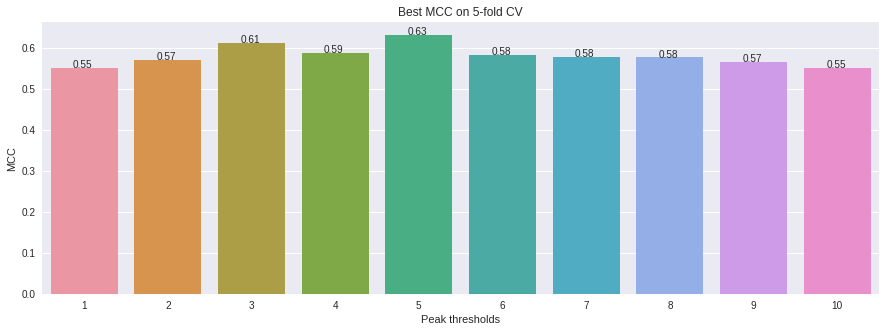

In [ ]:
plt.figure(figsize=(15,5))

# https://datavizpyr.com/how-to-annotate-bars-in-barplot-with-matplotlib-in-python/
splot = sns.barplot(x=peak_threshold, y=best_score_arr)
for p in splot.patches:
  splot.annotate(np.round(p.get_height(),2), (p.get_x()+p.get_width()/3, p.get_height()))
plt.xlabel('Peak thresholds') 
plt.ylabel('MCC')
plt.title('Best MCC on 5-fold CV')
plt.show()

Observations:
*  Threshold value of 5 gives the highest correlation of the peak feature with the target.

In [ ]:
# Save the optimum peak value
np.save(path + f'best_peak_threshold.npy', peak_val)

Observations:
*  Best MCC value is obtained for peak threshold value of 5. Hence peak threshold value of 5 is suitable for extracting the peak features.

In [ ]:
# Select the peak value which resulted in highest mcc score
peak_val = np.argmax(best_score_arr) + 1

peak_feat_df = pd.read_csv(path + f'peak_feats_{peak_val}_train.csv')
peak_feat_df.drop(['Unnamed: 0'], axis=1, inplace=True)

peak_feat_compare_df = pd.concat([metadata_train, peak_feat_df], axis=1)

print(peak_feat_compare_df.shape)
peak_feat_compare_df.head()

(8712, 24)


,signal_id,id_measurement,phase,target,num_p,num_n,num_f,num_s,mean_height,max_height,min_height,median_height,mean_width,max_width,min_width,median_width,mean_p_proms,max_p_proms,min_p_proms,median_p_proms,mean_n_proms,max_n_proms,min_n_proms,median_n_proms
0,0,0,0,0,52,43,228,128,7.565384,31.830868,5.018721,6.095793,48.614771,2549.444086,0.801503,1.320185,14.807746,49.426681,6.959947,13.226829,13.538026,41.033949,6.975146,12.391286
1,1,0,1,0,8,14,31,20,8.909411,24.387778,5.070035,8.072389,335.417398,7320.575034,1.151936,2.737048,17.483787,36.442979,9.142596,14.744507,14.717787,27.709242,7.177595,14.339355
2,2,0,2,0,31,40,230,111,7.692861,22.017086,5.002258,5.920647,54.133143,1887.736753,0.782752,1.240893,16.145936,41.777168,7.016927,13.141422,13.966523,32.535358,6.911921,12.378587
3,3,1,0,1,90,27,773,228,10.437392,54.370353,5.007715,7.833178,31.117740,2208.032888,0.830441,1.432025,19.974386,80.227492,0.005634,15.412109,14.906750,30.154141,7.807671,13.505944
4,4,1,1,1,21,46,231,88,9.582481,30.057484,5.005355,7.244968,152.879946,4854.156291,1.154402,2.046755,18.554346,48.711302,9.378423,15.257044,16.630498,48.711302,0.709863,13.354312


##### Peak features

###### Number of peaks

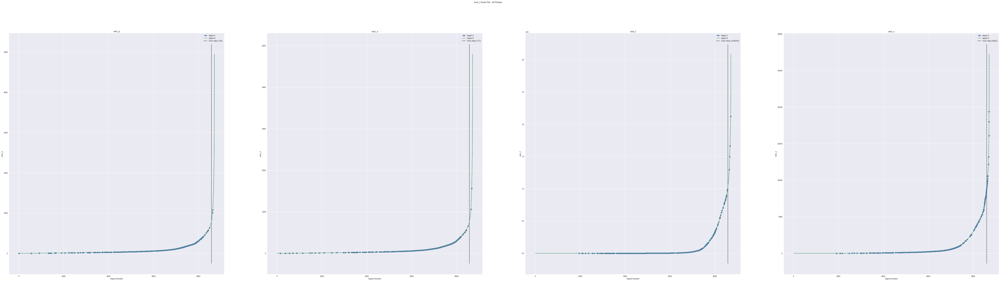

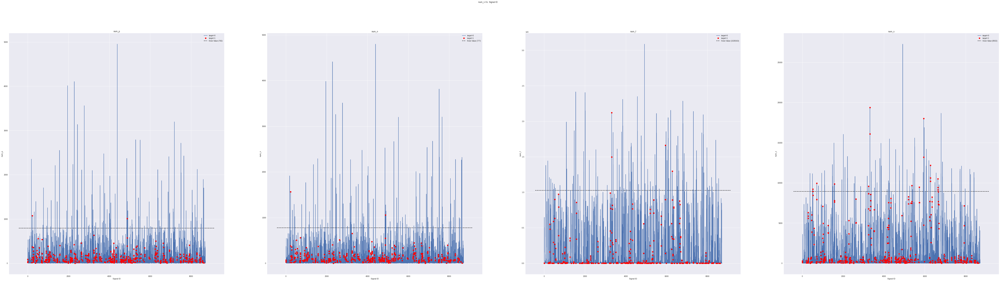

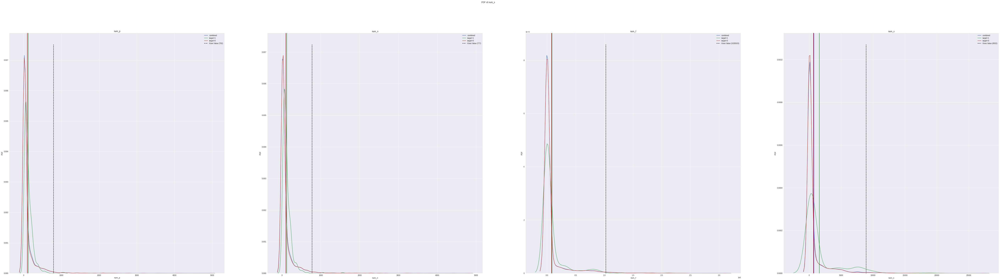

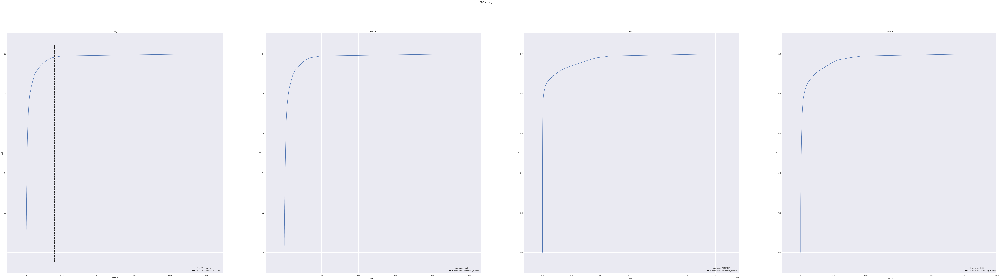

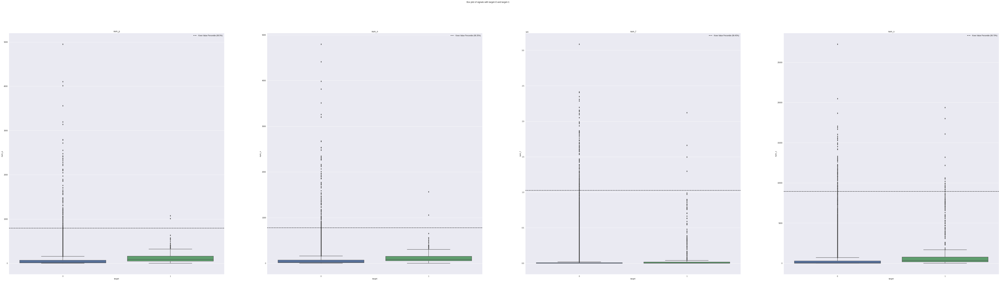

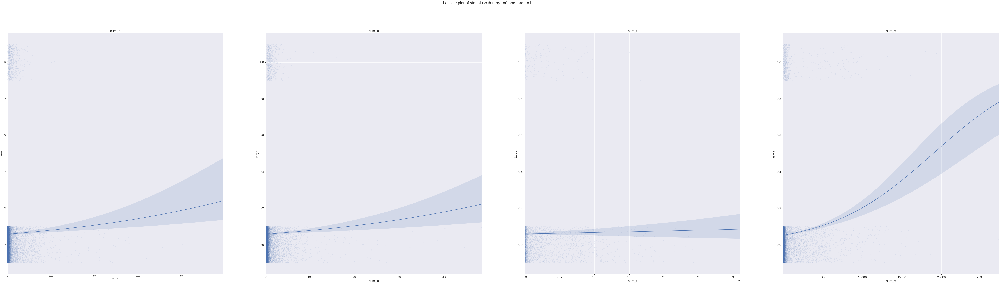

In [ ]:
feat_list = ['num_p', 'num_n', 'num_f', 'num_s']
plot_multi_compare(feat_list, 'one_phase', plt_list, peak_feat_compare_df)

Observations:
*  Knee plot:
    *  Most of the signals with target=1 lie below the knee value.
*  Feature vs. signal id
    *  Number of signals with target=1 above the knee value increases in the following order: number of positive peaks, negative peaks, false peaks, and symmetric peak pairs.
*  PDF
    *  Distribution of signal with target=1 and target=0 look similar.
    *  Height of signal with target=1 is less than the signal with target=0.
*  Logistic plot
    *  Linear separation of signals with target=1 and target=0 seems to be possible with number of symmetric peak pairs features.


###### Height

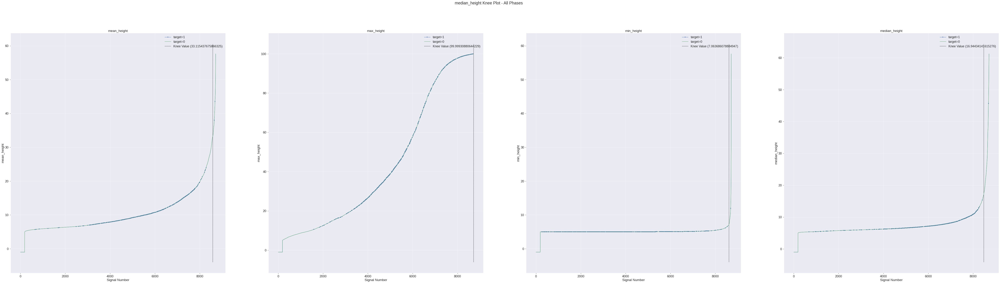

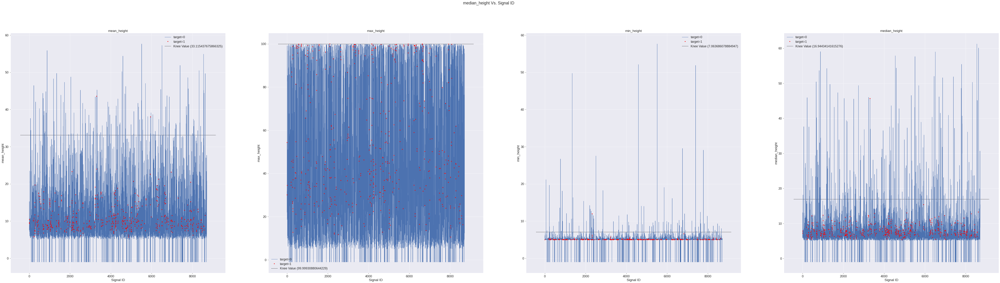

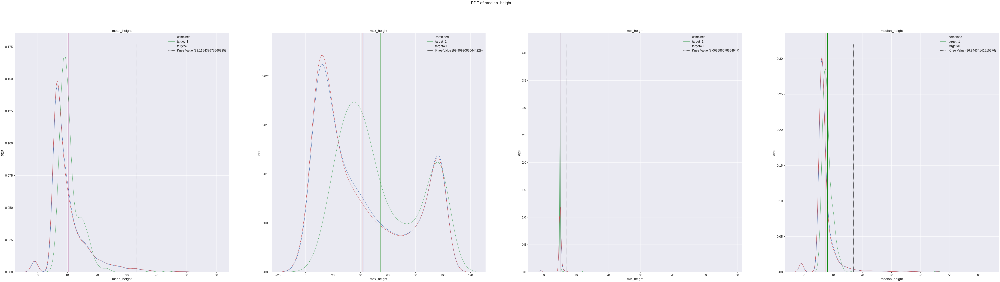

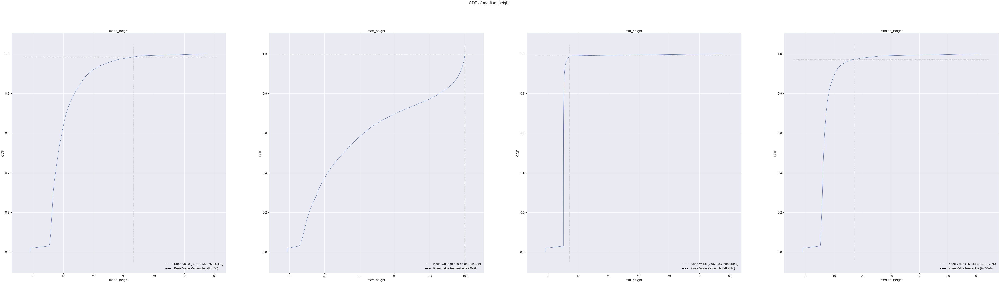

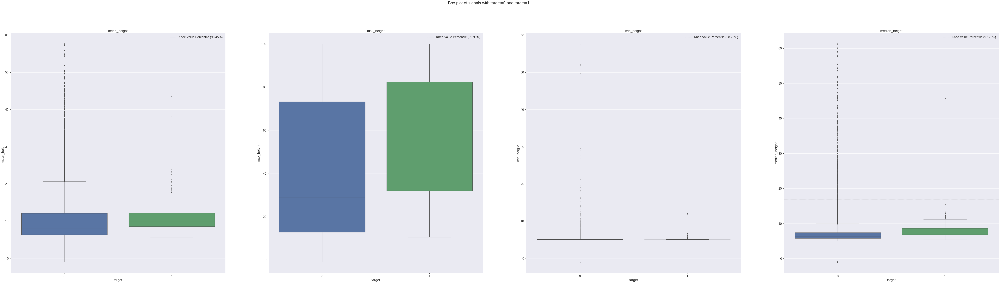

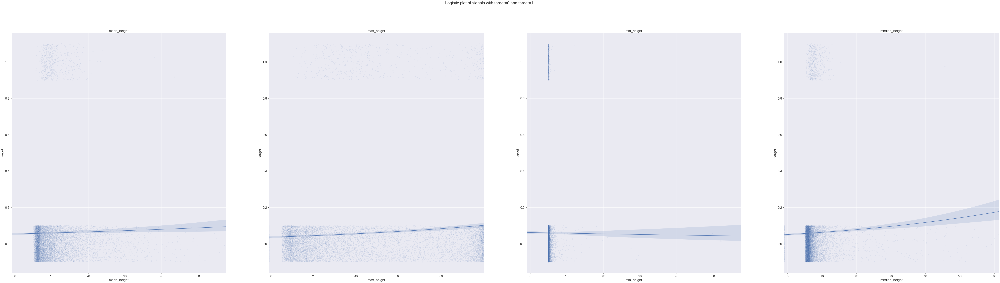

In [ ]:
feat_list = ['mean_height', 'max_height', 'min_height', 'median_height']
plot_multi_compare(feat_list, 'one_phase', plt_list, peak_feat_compare_df)

Observations:
*  Majority of minimum and median peak height values lie between 5 and 10.
*  PDF
    *  Multiple peak exists in the PDF of all the features.
    *  Distribution of signals with target=1 and target=0 overlap for all the features.
*  Box plot
    *  No clear seapration of IQRs of all the signals with target=1 and target=0.
*  Logistic plot
    *  No sigmoid like curve for any of the feature. Therefore, linear separation of the signals with target=1 and target=0 is not possible with these features.

###### Width

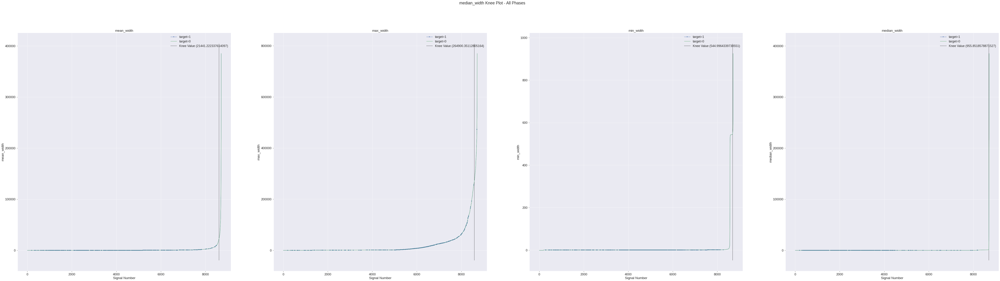

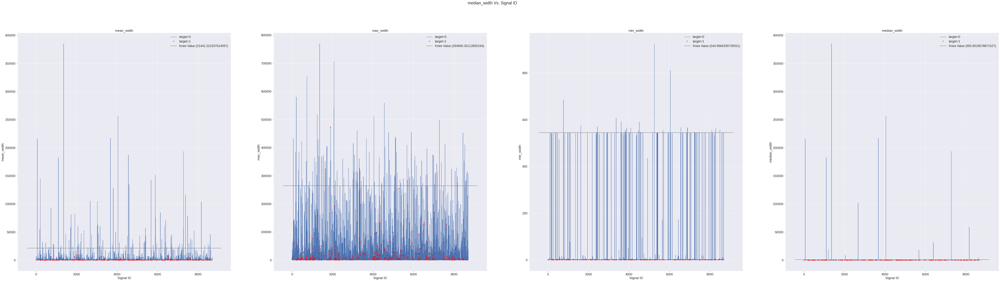

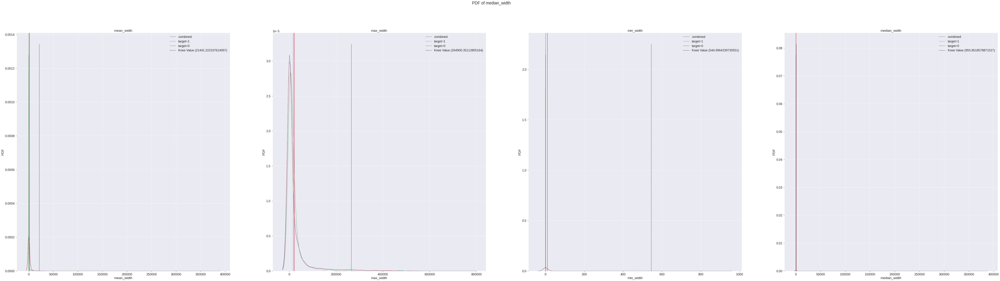

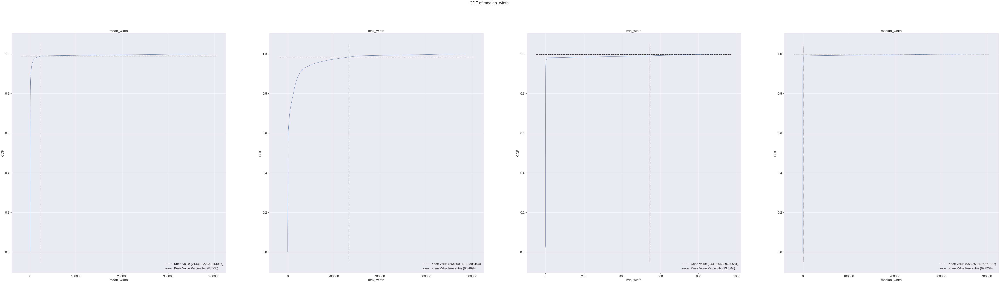

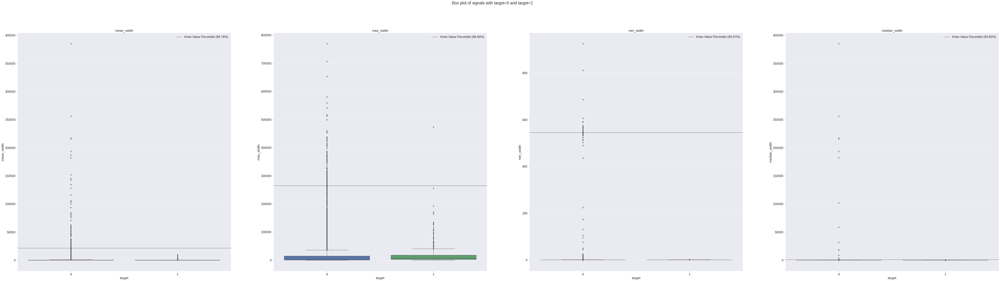

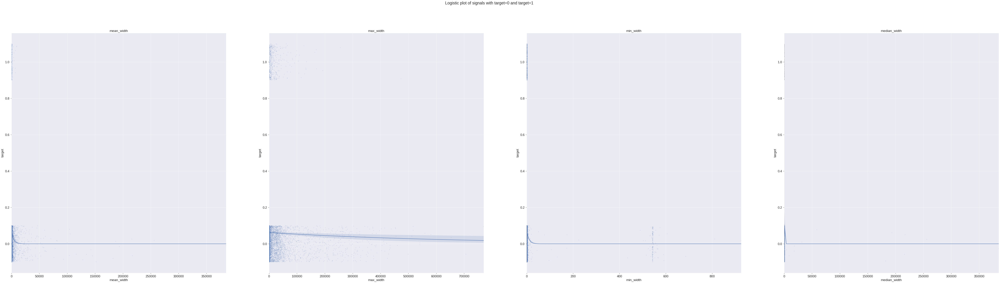

In [ ]:
feat_list = ['mean_width', 'max_width', 'min_width', 'median_width']
plot_multi_compare(feat_list, 'one_phase', plt_list, peak_feat_compare_df)

Observations:
*  Large amount of extreme values exists for mean, min, and median width features.
*  Most of the values are conentrated in and around 0.
*  No distinct separation of IQRs in the box plot.
*  None of the features are useful in linearly separating the target.

###### Positive Prominences

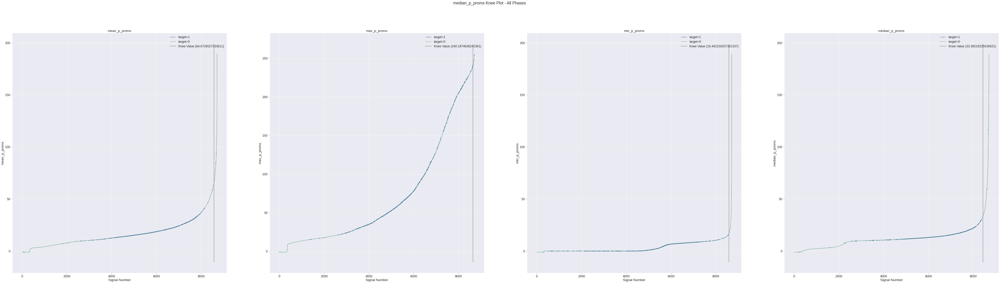

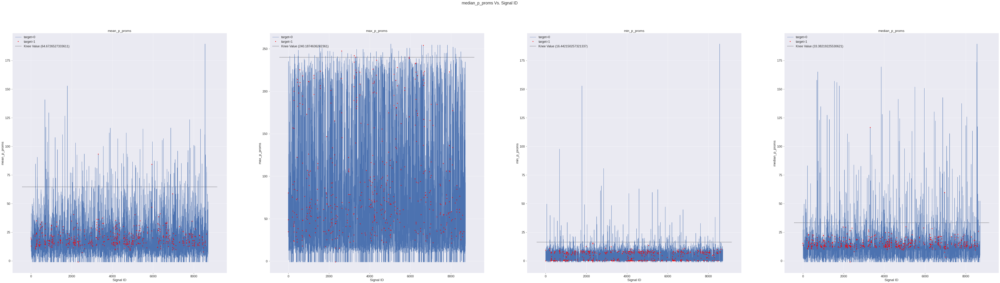

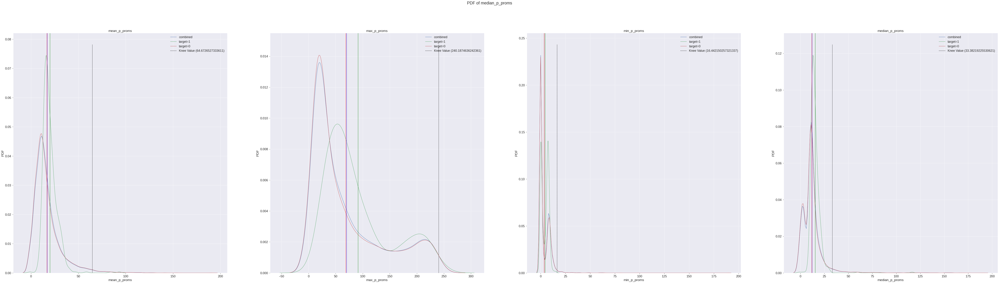

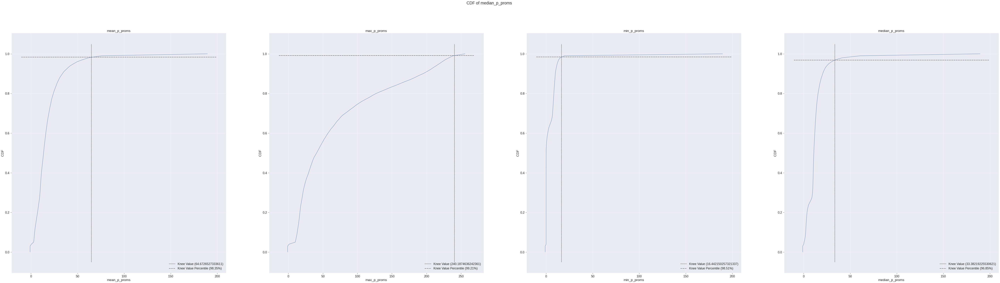

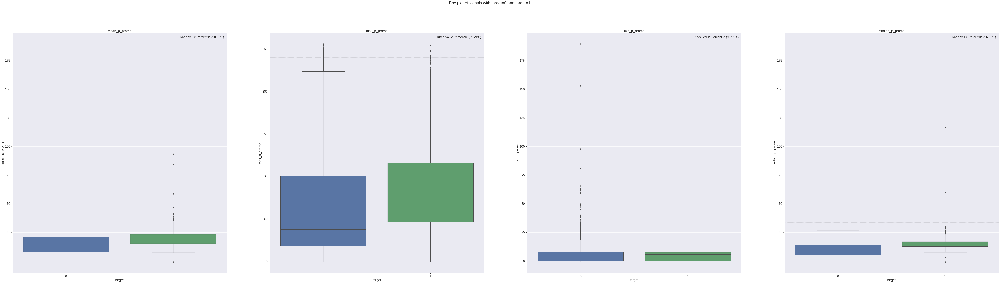

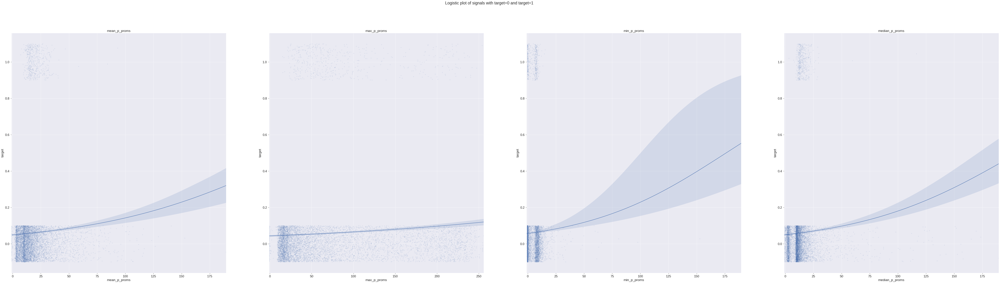

In [ ]:
feat_list = ['mean_p_proms', 'max_p_proms', 'min_p_proms', 'median_p_proms']
plot_multi_compare(feat_list, 'one_phase', plt_list, peak_feat_compare_df)

Observations:
*  Number of extreme values are more in mean positive peak, minimum of positive peak, and median peak prominence features.
*  Multiple peaks exist in the PDF of number of maximum peak, minimum peak, and median peak prominences.
*  Peak of signal with target=1 is more than that with target=0 for mean positive peak prominence feature.
*  No clear separation of IQRs of signals with target=1 and target=0.
*  Linear separability of the signal is also not possible with any of these feature alone.

###### Negative Prominences

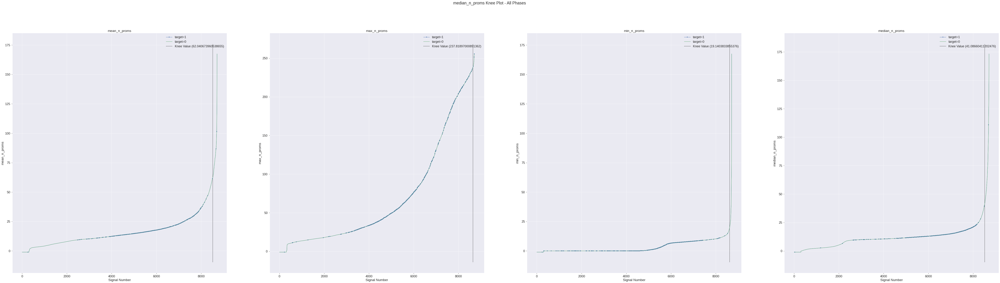

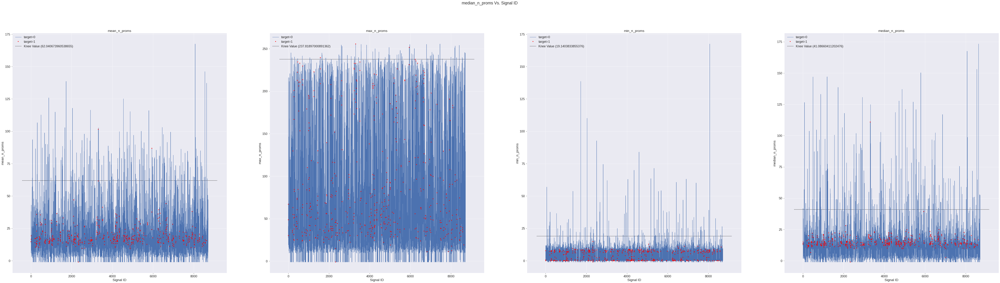

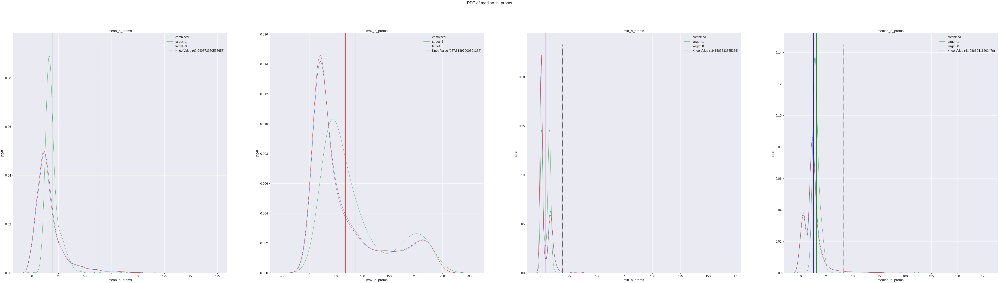

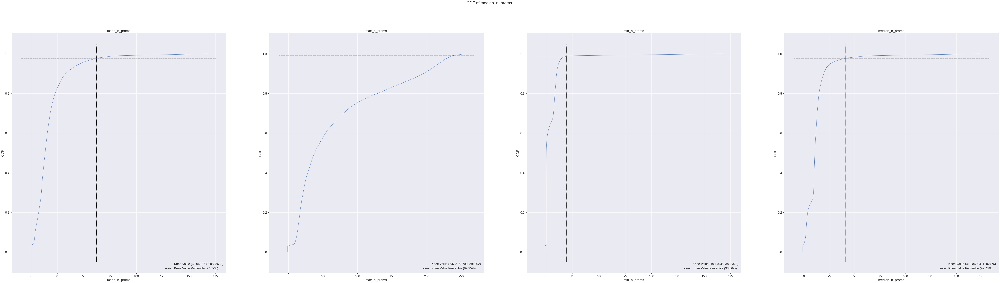

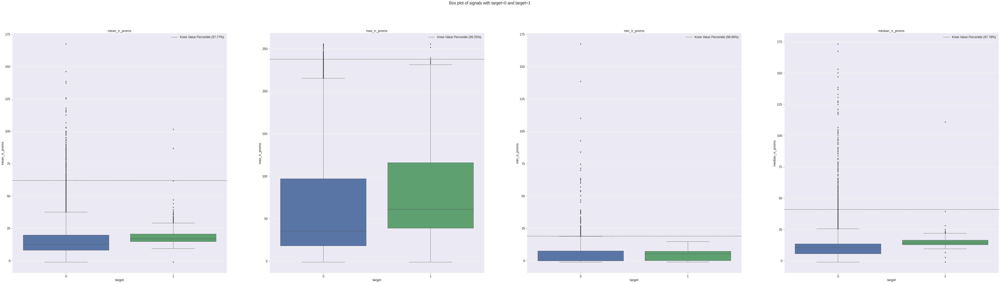

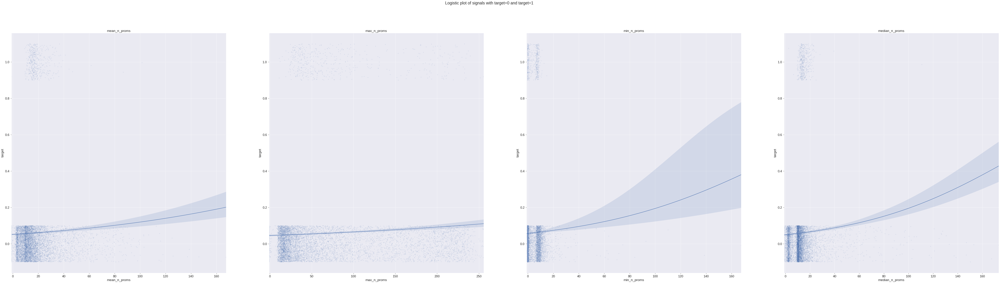

In [ ]:
feat_list = ['mean_n_proms', 'max_n_proms', 'min_n_proms', 'median_n_proms']
plot_multi_compare(feat_list, 'one_phase', plt_list, peak_feat_compare_df)

Observations:
*  Number of extreme values are more in mean negative peak, minimum of negative peak, and median peak prominence features.
*  Multiple peaks exist in the PDF of number of maximum peak, minimum peak, and median peak prominences.
*  Peak of signal with target=1 is more than that with target=0 for mean positive peak prominence feature.
*  No clear separation of IQRs of signals with target=1 and target=0 for mean, max, min negative peak prominence features, while there is some separation for median negative peak prominence feature.
*  Linear separability of the signal is also not possible with any of these feature alone.

##### Corona Discharge Pattern

In [ ]:
# Load the best peak threshold
peak_val = int(np.load(path + 'best_peak_threshold.npy'))
print(f"Best peak threshold is {peak_val}")

Best peak threshold is 5


###### Target=0

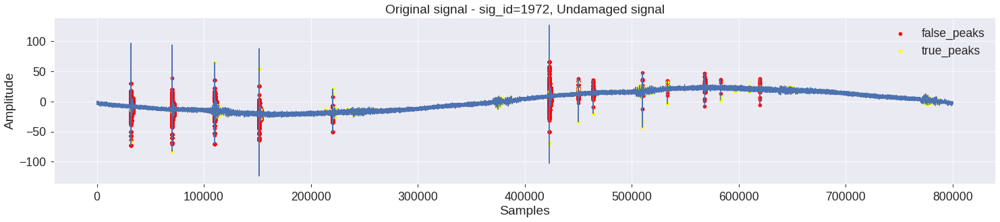

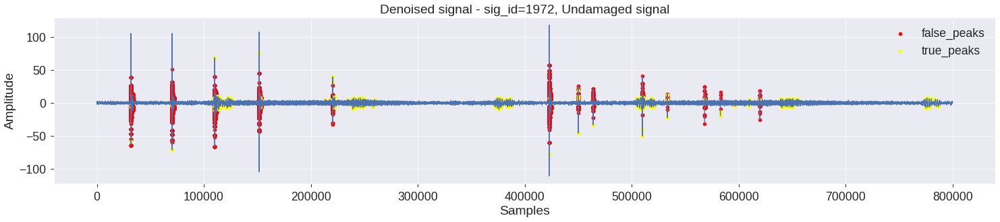

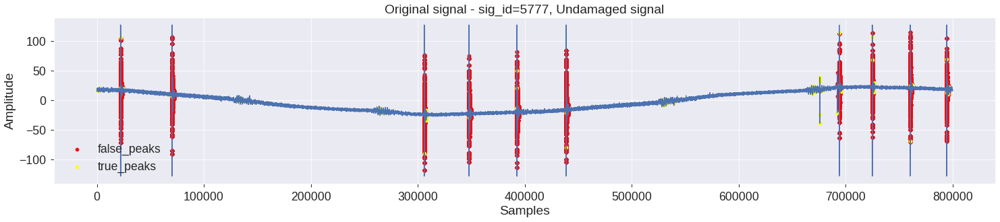

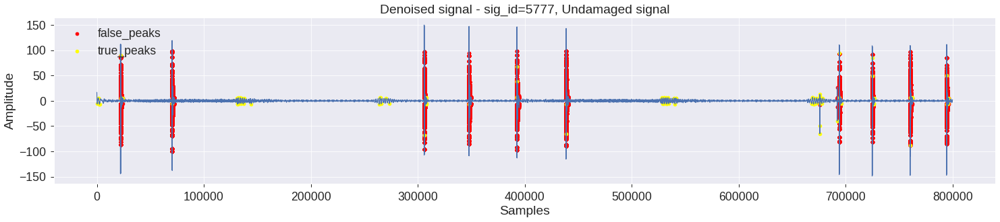

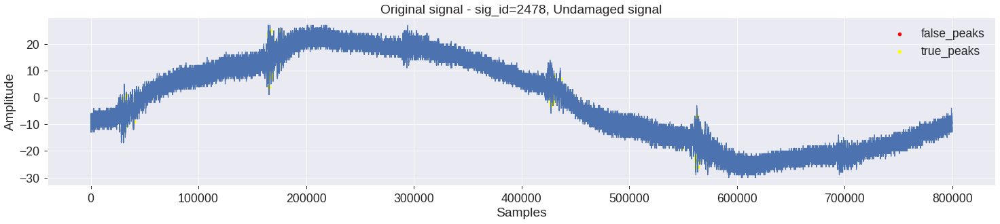

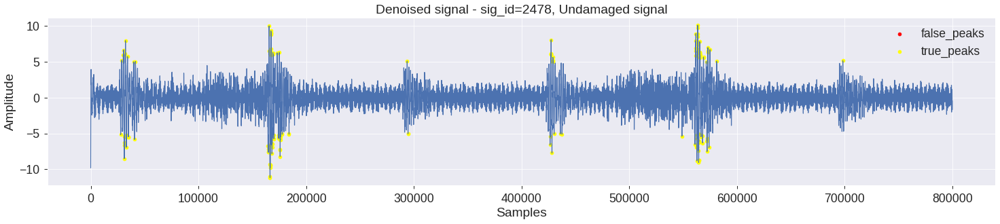

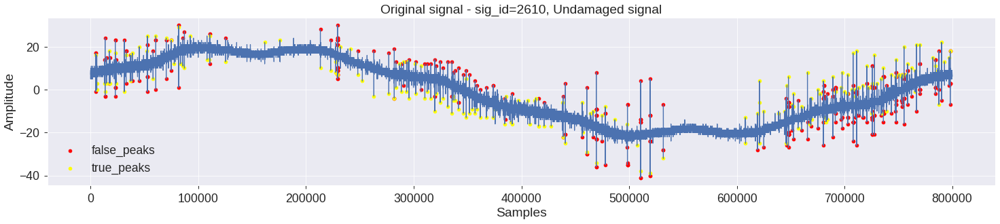

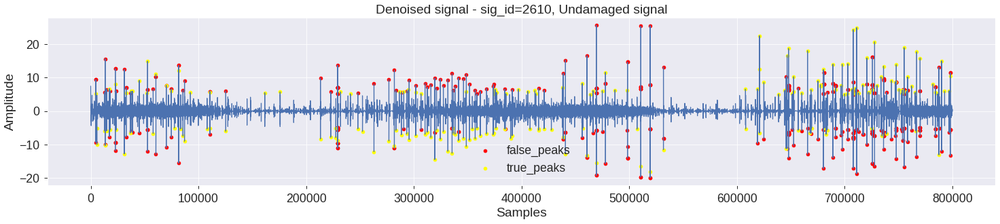

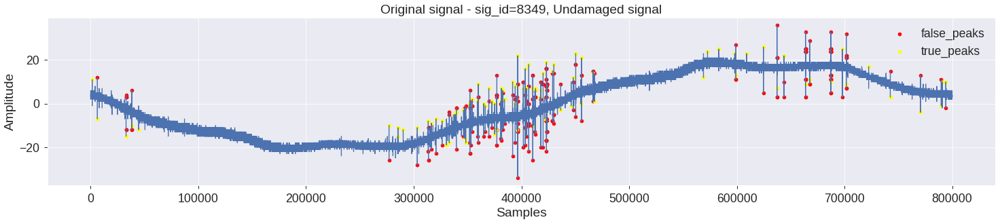

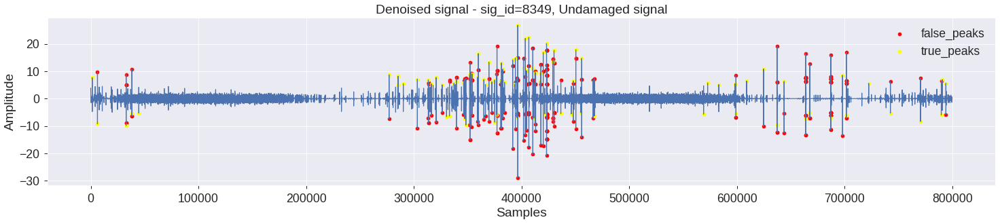

In [ ]:
t0_samples = random.sample(metadata_train.query(f'target==0').index.tolist(), 5)
plot_titles = ['Original', 'Denoised']

for sig_id in t0_samples:
  sig_arr = []
  sig_arr.append(train[str(sig_id)].values)
  sig_arr.append(dwt(sig_arr[-1]))

  t_peaks, f_peaks, s_peaks, p_peaks, n_peaks = get_all_peaks(sig_arr[-1], peak_threshold=peak_val)
  
  for ind, plot_name in enumerate(plot_titles):
    plt.figure(figsize=(25,10))
    plt.subplot(2,1,ind+1)
    plt.plot(sig_arr[ind])
    plt.scatter(f_peaks, sig_arr[ind][f_peaks], c='red', label='false_peaks')
    plt.scatter(t_peaks, sig_arr[ind][t_peaks], c='yellow', label='true_peaks')
    plt.legend()
    plt.title(f'{plot_name} signal - sig_id={sig_id}, Undamaged signal')
    plt.xlabel(f'Samples')
    plt.ylabel(f'Amplitude')
    plt.show()
  print("="*25)

Observations:
*  Undamaged signal IDs 1972, 5777, 2478, 2610, 8349 are selected randomly.
*  False peaks are observed majorly between 0-100000, 300000-500000, 650000-80000 in most the signal ids.
*  True peaks are spread out in the entire signal.
*  True and false peaks often occur at the same location.

###### Target=1

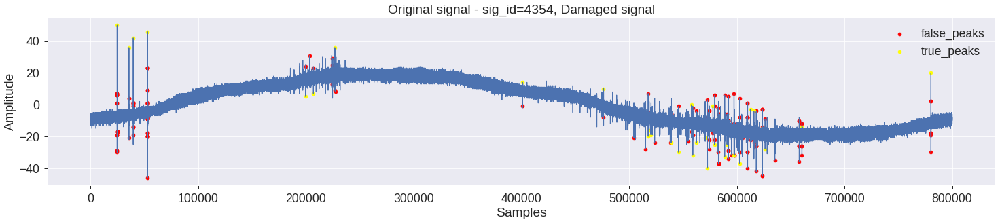

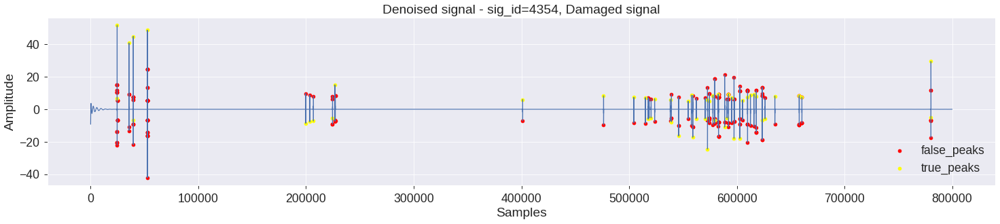

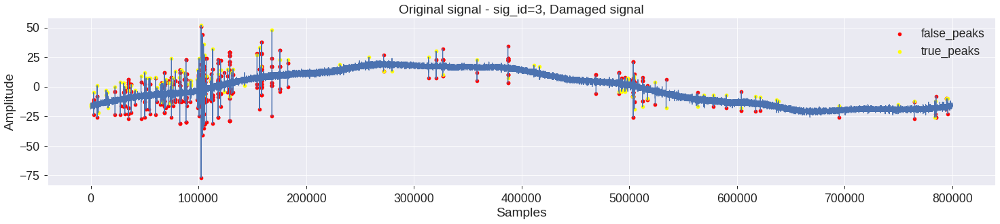

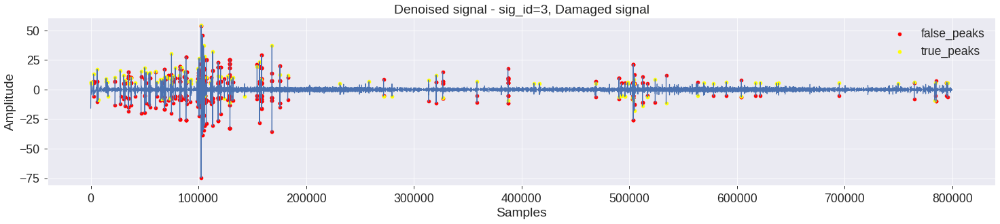

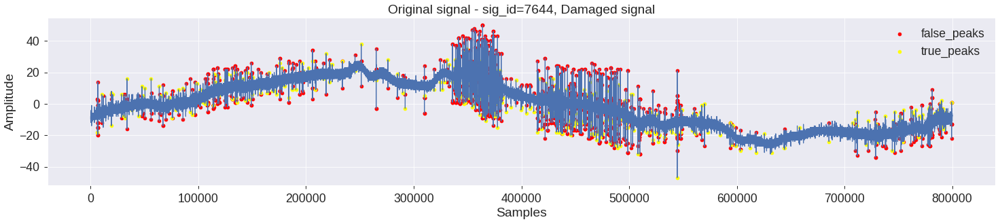

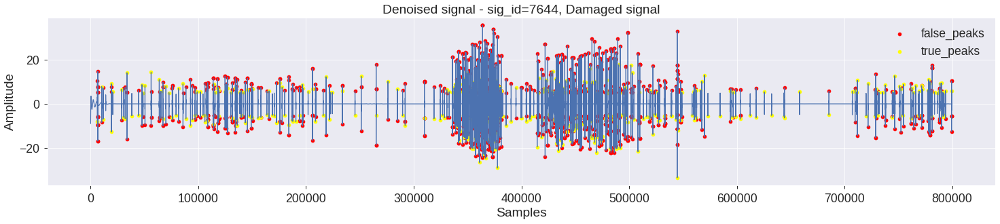

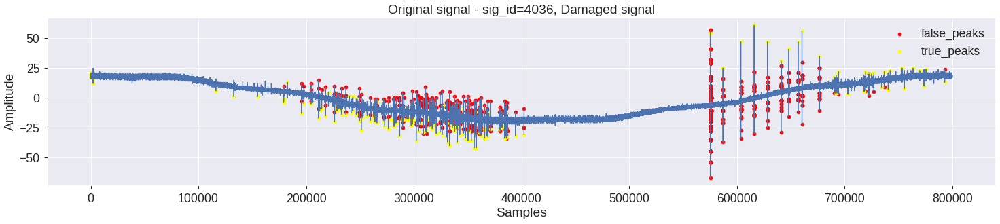

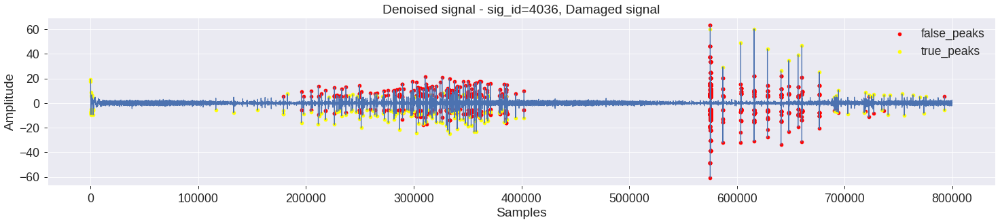

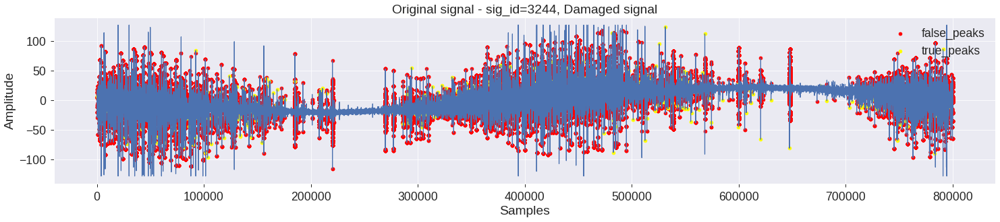

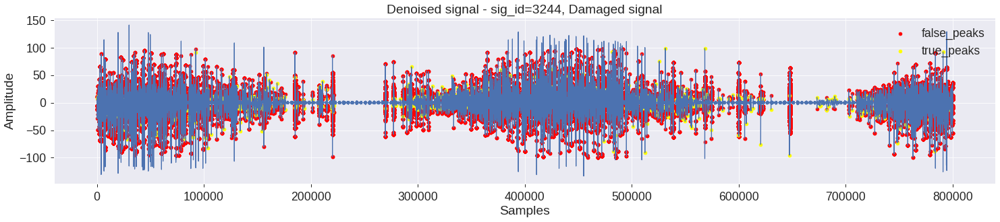

In [ ]:
t1_samples = random.sample(metadata_train.query(f'target==1').index.tolist(), 5)
plot_titles = ['Original', 'Denoised']

for sig_id in t1_samples:
  sig_arr = []
  sig_arr.append(train[str(sig_id)].values)
  sig_arr.append(dwt(sig_arr[-1]))

  t_peaks, f_peaks, s_peaks, p_peaks, n_peaks = get_all_peaks(sig_arr[-1], peak_threshold=peak_val)
  
  for ind, plot_name in enumerate(plot_titles):
    plt.figure(figsize=(25,10))
    plt.subplot(2,1,ind+1)
    plt.plot(sig_arr[ind])
    plt.scatter(f_peaks, sig_arr[ind][f_peaks], c='red', label='false_peaks')
    plt.scatter(t_peaks, sig_arr[ind][t_peaks], c='yellow', label='true_peaks')
    plt.legend()
    plt.title(f'{plot_name} signal - sig_id={sig_id}, Damaged signal')
    plt.xlabel(f'Samples')
    plt.ylabel(f'Amplitude')
    plt.show()
  print("="*25)

Observations:
*  Undamaged signal IDs 4354, 3, 7644, 4036, 3244 are selected randomly.
*  In signal ids 3, 7644, 3244 the false peaks are spread in the entire signal, while in signal id 4354 and 4036, it is present in clusters around a few indices.
*  The behaviour of true peaks is similar to that of false peaks.
*  True and false peaks often occur at the same location.

#### Test data

In [ ]:
save_file_path = path + f'test_path/peak_feats_{peak_val}_test.csv'
if not os.path.isfile(save_file_path):
    peak_cols = ['num_p', 'num_n', 'num_f', 'num_s',
                'mean_height', 'max_height', 'min_height', 'median_height',
                'mean_width', 'max_width', 'min_width', 'median_width',
                'mean_p_proms', 'max_p_proms', 'min_p_proms', 'median_p_proms',
                'mean_n_proms', 'max_n_proms', 'min_n_proms', 'median_n_proms']

    peak_val = int(np.load(path + f'best_peak_threshold.npy'))
    print(f"Peak threshold: {peak_val}")
    
    start_time = datetime.now()    
    print(f"Start time: {start_time}")

    parallel_proc_func(get_peak_wrapper, peak_cols, metadata_test.shape[0], metadata_test['signal_id'].loc[0], 
                      save_file_path, ('test', peak_val))

    print(f"Total time taken: {datetime.now()-start_time}\n")

peak_feat_df = pd.read_csv(save_file_path)
peak_feat_df.drop(['Unnamed: 0'], axis=1, inplace=True)

print(peak_feat_df.shape)
peak_feat_df.head()

Peak threshold: 5
Start time: 2020-10-28 19:10:48.309351
2032 (9.99%) signals completed. Time taken: 0:31:06.930976
4064 (19.98%) signals completed. Time taken: 0:33:46.545595
6096 (29.97%) signals completed. Time taken: 0:40:01.524891
8128 (39.97%) signals completed. Time taken: 0:29:28.367264
10160 (49.96%) signals completed. Time taken: 0:45:24.116128
12192 (59.95%) signals completed. Time taken: 0:26:03.924979
14224 (69.94%) signals completed. Time taken: 0:35:55.377862
16256 (79.93%) signals completed. Time taken: 0:29:04.709580
18288 (89.92%) signals completed. Time taken: 0:31:55.022225
20320 (99.92%) signals completed. Time taken: 0:31:37.871985
20337 (100.0%) signals completed. Time taken: 0:00:19.676297
Total time taken: 5:34:48.186968

(20337, 20)


,num_p,num_n,num_f,num_s,mean_height,max_height,min_height,median_height,mean_width,max_width,min_width,median_width,mean_p_proms,max_p_proms,min_p_proms,median_p_proms,mean_n_proms,max_n_proms,min_n_proms,median_n_proms
0,55,83,394,166,7.362794,20.939406,5.008626,6.358988,58.823325,3338.511852,0.569921,1.383525,13.387322,32.937869,0.374250,12.415143,13.544484,41.423306,0.006236,12.209854
1,23,36,18,12,7.742982,17.946874,5.015151,6.945649,809.691333,44344.701407,0.580110,1.710235,7.849981,29.017163,0.039553,4.251752,9.649607,29.017163,0.000686,9.008868
2,64,58,224,134,7.902197,24.724423,5.011014,6.764606,33.331085,3469.155373,0.906527,1.253392,15.635547,43.562588,7.489699,13.030435,13.175977,30.126907,8.682185,12.889322
3,0,1,0,0,5.496496,5.496496,5.496496,5.496496,544.468766,544.468766,544.468766,544.468766,-1.000000,-1.000000,-1.000000,-1.000000,9.390111,9.390111,9.390111,9.390111
4,61,54,28,5,5.392705,9.455630,5.000413,5.242288,6.125360,8.398746,2.600331,5.927745,10.058348,15.370764,7.590973,10.054804,10.344860,16.457456,8.616368,10.298694
